# Multiclass semantic segmentation using DeepLabV3+
- https://keras.io/examples/vision/deeplabv3_plus/
- https://learnopencv.com/deeplabv3-ultimate-guide/

## Dataset
Rellis-3D in **All labels (20 classes)**

https://arxiv.org/abs/1811.12596

## Guardar modelo, pesos y como reentrenar

https://www.tensorflow.org/tutorials/keras/save_and_load?hl=es-419

### Environment tf39

In [1]:
import os
import numpy as np
from glob import glob
import cv2
from scipy.io import loadmat
import matplotlib.pyplot as plt

import keras
from keras import layers
from keras import ops
from keras.applications.resnet import ResNet50
from keras.applications.resnet import preprocess_input

# For data preprocessing
import tensorflow as tf
from tensorflow import image as tf_image
from tensorflow import data as tf_data
from tensorflow import io as tf_io
import warnings
warnings.filterwarnings('ignore')


In [2]:
print(keras.__version__)
print(tf.__version__)

3.0.5
2.16.1


In [3]:
#!pip install tensorflow
!pip check tensorflow

No broken requirements found.


## Loading Rellis-3D Dataset


In [15]:
IMAGE_SIZE = 512
BATCH_SIZE = 4
NUM_CLASSES = 20
TRAIN_DIR = "./rellis20/train"
VALID_DIR = "./rellis20/val"
TEST_DIR = "./rellis20/test"

train_images = sorted(glob(os.path.join(TRAIN_DIR, "images/*")))
train_masks = sorted(glob(os.path.join(TRAIN_DIR, "labels/*")))
#train_masks = sorted(glob(os.path.join(TRAIN_DIR, "masks_id/*")))
val_images = sorted(glob(os.path.join(VALID_DIR, "images/*")))
val_masks = sorted(glob(os.path.join(VALID_DIR, "labels/*")))
#val_masks = sorted(glob(os.path.join(VALID_DIR, "masks_id/*")))
test_images = sorted(glob(os.path.join(TEST_DIR, "images/*")))
test_masks = sorted(glob(os.path.join(TEST_DIR, "labels/*")))
#test_masks = sorted(glob(os.path.join(TEST_DIR, "masks_id/*")))
test_maskscolors = sorted(glob(os.path.join(TEST_DIR, "masks_colors/*")))

print(len(train_images))
print(len(train_masks))
print(len(val_images))
print(len(val_masks))
print(len(test_images))
print(len(test_masks))
print(len(test_maskscolors))

3302
3302
983
983
1672
1672
1672


In [16]:
print(train_masks[0])

./rellis20/train\labels\frame000000-1581624075_250_20.png


## Convert mask images to correct masks ids 
- Round values and convert to int8
- Save as png format image in masks_id subfolder of train, val and test folders

In [17]:
from PIL import Image
def convert_masks_to_maskid(masks_path):
    print('Images to convert: ', len(masks_path))
    count=0
    for mask_path in masks_path:
        dest_path =  mask_path.replace("labels", "masks_id")
        mask = Image.open(mask_path)
        np_mask = np.array(mask)
        np.around(np_mask, decimals=0, out=np_mask)
        image = Image.fromarray(np_mask) 
        image.save(dest_path) 
        count+=1
    print('Images converted: ',count)
    
def np_array_to_tensor(np_array):
  tensor_array = tf.convert_to_tensor(np_array, dtype=tf.int8)
  return tensor_array

def tensor_to_np_array(tensor_array):
    np_array=np.array(tensor_array)
    return np_array



### only perform on time

In [28]:
#convert_masks_to_maskid(train_masks)
#convert_masks_to_maskid(val_masks)
#convert_masks_to_maskid(test_masks)


Images to convert:  3302
Images converted:  3302
Images to convert:  983
Images converted:  983
Images to convert:  1672
Images converted:  1672


In [18]:

def read_image(image_path, mask=False):
    image = tf_io.read_file(image_path)
    if mask:
        image = tf_image.decode_png(image, channels=1)
        image.set_shape([None, None, 1])
        image = tf_image.resize(images=image, size=[IMAGE_SIZE, IMAGE_SIZE])
        image = tf.round(image) 
    else:
        image = tf_image.decode_png(image, channels=3)
        image.set_shape([None, None, 3])
        image = tf_image.resize(images=image, size=[IMAGE_SIZE, IMAGE_SIZE])
    return image


def load_data(image_list, mask_list):
    image = read_image(image_list)
    mask = read_image(mask_list, mask=True)
    return image, mask


def data_generator(image_list, mask_list, batch_size):
    dataset = tf_data.Dataset.from_tensor_slices((image_list, mask_list))
    dataset = dataset.map(load_data, num_parallel_calls=tf_data.AUTOTUNE)
    dataset = dataset.batch(batch_size, drop_remainder=True)
    return dataset

train_dataset = data_generator(train_images, train_masks,BATCH_SIZE)
val_dataset = data_generator(val_images, val_masks,BATCH_SIZE)
#test_dataset = data_generator(test_images, test_masks, 1)     # Batchsize=1

print("Train Dataset:", train_dataset)
print("Val Dataset:", val_dataset)
#print("Test Dataset:", test_dataset)

Train Dataset: <_BatchDataset element_spec=(TensorSpec(shape=(4, 512, 512, 3), dtype=tf.float32, name=None), TensorSpec(shape=(4, 512, 512, 1), dtype=tf.float32, name=None))>
Val Dataset: <_BatchDataset element_spec=(TensorSpec(shape=(4, 512, 512, 3), dtype=tf.float32, name=None), TensorSpec(shape=(4, 512, 512, 1), dtype=tf.float32, name=None))>


### Check the shape of GT masks id

In [20]:
# extract Gt mask id
path_gt_mask = test_masks[0]
gtmask0 = read_image(path_gt_mask, mask=True)

print(gtmask0.shape)
#print(gtmask0)

(512, 512, 1)


## Building the DeepLabV3+ model
**DeepLabv3+** amplía DeepLabv3 agregando una estructura codificador-decodificador (decoder-encoder). El módulo codificador procesa información contextual multiescala aplicando convolución dilatada en múltiples escalas, mientras que el módulo decodificador refina los resultados de la segmentación a lo largo de los límites del objeto.

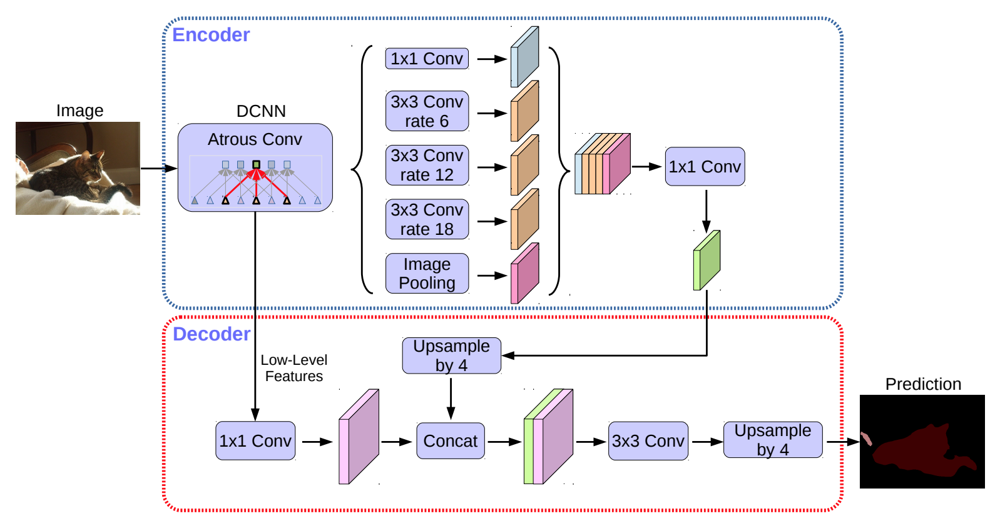

**Convolución dilatada**: con la convolución dilatada, a medida que profundizamos en la red, podemos mantener el paso constante pero con un campo de visión más amplio sin aumentar la cantidad de parámetros o la cantidad de cálculo. Además, permite mapas de características de salida más grandes, lo cual es útil para la segmentación semántica.

La razón para utilizar la **agrupación de pirámides espaciales dilatadas** es que se demostró que a medida que la tasa de muestreo aumenta, la cantidad de ponderaciones de filtro válidas (es decir, ponderaciones que se aplican a la región de características válida, en lugar de ceros rellenos) se reduce.

In [21]:
def convolution_block(
    block_input,
    num_filters=256,
    kernel_size=3,
    dilation_rate=1,
    use_bias=False,
):
    x = layers.Conv2D(
        num_filters,
        kernel_size=kernel_size,
        dilation_rate=dilation_rate,
        padding="same",
        use_bias=use_bias,
        kernel_initializer=keras.initializers.HeNormal(),
    )(block_input)
    x = layers.BatchNormalization()(x)
    return ops.nn.relu(x)

def DilatedSpatialPyramidPooling(dspp_input):
    dims = dspp_input.shape
    x = layers.AveragePooling2D(pool_size=(dims[-3], dims[-2]))(dspp_input)
    x = convolution_block(x, kernel_size=1, use_bias=True)
    out_pool = layers.UpSampling2D(
        size=(dims[-3] // x.shape[1], dims[-2] // x.shape[2]),
        interpolation="bilinear",
    )(x)

    out_1 = convolution_block(dspp_input, kernel_size=1, dilation_rate=1)
    out_6 = convolution_block(dspp_input, kernel_size=3, dilation_rate=6)
    out_12 = convolution_block(dspp_input, kernel_size=3, dilation_rate=12)
    out_18 = convolution_block(dspp_input, kernel_size=3, dilation_rate=18)

    x = layers.Concatenate(axis=-1)([out_pool, out_1, out_6, out_12, out_18])
    output = convolution_block(x, kernel_size=1)
    return output

Las características del encoder primero se muestrean bilinealmente mediante un factor 4 y luego se concatenan con las características de bajo nivel correspondientes de la red troncal que tienen la misma resolución espacial. Para este ejemplo, utilizamos un ResNet50 previamente entrenado en ImageNet como modelo de red troncal y utilizamos las funciones de bajo nivel del bloque conv4_block6_2_relu de la red troncal.

In [22]:
def DeeplabV3Plus(image_size, num_classes):
    #model_input = keras.Input(shape=(image_size, image_size, 3))
    #preprocessed = preprocess_input(model_input)
    #resnet50 = ResNet50(weights="imagenet", include_top=False, input_tensor=preprocessed)

    model_input = keras.Input(shape=(image_size, image_size, 3))
    preprocess = tf.keras.layers.Lambda(lambda x:preprocess_input(x))(model_input)
    resnet50 = ResNet50(weights="imagenet", include_top=False, input_tensor=preprocess)
    x = resnet50.get_layer("conv4_block6_2_relu").output
    x = DilatedSpatialPyramidPooling(x)

    input_a = layers.UpSampling2D(
        size=(image_size // 4 // x.shape[1], image_size // 4 // x.shape[2]),
        interpolation="bilinear",
    )(x)
    input_b = resnet50.get_layer("conv2_block3_2_relu").output
    input_b = convolution_block(input_b, num_filters=48, kernel_size=1)

    x = layers.Concatenate(axis=-1)([input_a, input_b])
    x = convolution_block(x)
    x = convolution_block(x)
    x = layers.UpSampling2D(
        size=(image_size // x.shape[1], image_size // x.shape[2]),
        interpolation="bilinear",
    )(x)
    model_output = layers.Conv2D(num_classes, kernel_size=(1, 1), padding="same")(x)
    return keras.Model(inputs=model_input, outputs=model_output)


model = DeeplabV3Plus(image_size=IMAGE_SIZE, num_classes=NUM_CLASSES)
#model.summary()

## Training with early stopping, saving model+weights for each epoch and tensorboard


Callbaks de keras para:
- crear checkpoints del modelo con sus pesos para cada época.
- añadir early stopping, cuando el modelo no aprenda durante 3 épocas consecutivas el entrenamiento se detiene
- tensorboard, vemos las gráficas accuracy y loss durante el entrenamiento

In [23]:
from keras import callbacks

checkpoint_filepath ='./checkpoint/rellis3D_20_1/checkpoint.model.keras'
tensorboard_filepath='./checkpoint/rellis3D_20_1/logs'
#checkpoint_filepath='./checkpoint/rellis3D_6/model.{epoch:02d}-{val_loss:.2f}.h5'

# This callback will stop the training when there is no improvement in
# the loss for 3 consecutive epochs --> patience = 3.
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='loss',  
    patience=3
)

# save the model and weights for each epoch
model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
    checkpoint_filepath,
    monitor="val_loss",
    verbose=0,
    save_best_only=False,
    save_weights_only=False,
    mode="min",
    save_freq="epoch",
    initial_value_threshold=None,
)

# histogram frequency for each epoch 
tensorboard = tf.keras.callbacks.TensorBoard(
    log_dir=tensorboard_filepath,
    write_graph=True,
    histogram_freq=1
)

mycallbacks = [
    early_stopping,
    model_checkpoint,
    tensorboard,
]



#### Compilar modelo
Entrenamos el modelo utilizando entropía cruzada categórica dispersa como función de pérdida y Adam como optimizador y learning rate dinámico

In [24]:
EPOCHS = 30

# loss function
loss = keras.losses.SparseCategoricalCrossentropy(from_logits=True)

model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.001),
    loss=loss,
    metrics=["accuracy"],
)


#### Train

In [12]:
history = model.fit(train_dataset, validation_data=val_dataset, epochs=EPOCHS, callbacks=[mycallbacks])

Epoch 1/30
825/825 ━━━━━━━━━━━━━━━━━━━━ 4460s 5s/step - accuracy: 0.9179 - loss: 0.2691 - val_accuracy: 0.4771 - val_loss: 18.6348
Epoch 2/30
825/825 ━━━━━━━━━━━━━━━━━━━━ 4421s 5s/step - accuracy: 0.9148 - loss: 0.2624 - val_accuracy: 0.6046 - val_loss: 15.9239
Epoch 3/30
825/825 ━━━━━━━━━━━━━━━━━━━━ 4465s 5s/step - accuracy: 0.9189 - loss: 0.2439 - val_accuracy: 0.6502 - val_loss: 1.9612
Epoch 4/30
825/825 ━━━━━━━━━━━━━━━━━━━━ 4452s 5s/step - accuracy: 0.9251 - loss: 0.2233 - val_accuracy: 0.6736 - val_loss: 1.5146
Epoch 5/30
825/825 ━━━━━━━━━━━━━━━━━━━━ 4453s 5s/step - accuracy: 0.9292 - loss: 0.2095 - val_accuracy: 0.7043 - val_loss: 2.2241
Epoch 6/30
825/825 ━━━━━━━━━━━━━━━━━━━━ 4469s 5s/step - accuracy: 0.9314 - loss: 0.2039 - val_accuracy: 0.4577 - val_loss: 3.0243
Epoch 7/30
825/825 ━━━━━━━━━━━━━━━━━━━━ 4476s 5s/step - accuracy: 0.9340 - loss: 0.1944 - val_accuracy: 0.5823 - val_loss: 1.5272
Epoch 8/30
825/825 ━━━━━━━━━━━━━━━━━━━━ 4465s 5s/step - accuracy: 0.9360 - loss: 0.1859 

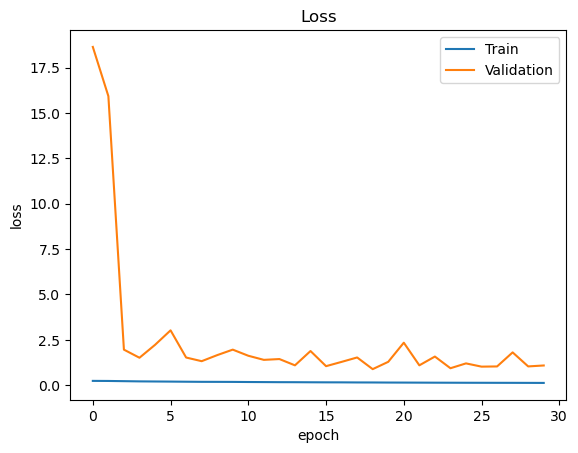

In [13]:
plt.plot(history.history["loss"], label = "Train")
plt.plot(history.history["val_loss"], label = "Validation")
plt.legend(loc = 'upper right')
plt.title("Loss")
plt.ylabel("loss")
plt.xlabel("epoch")
plt.show()

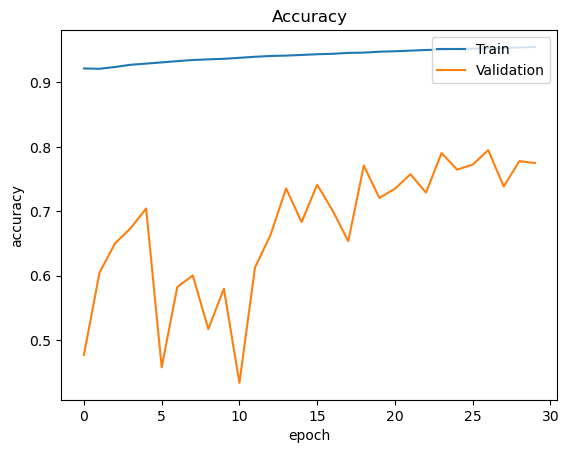

In [14]:
plt.plot(history.history["accuracy"], label = "Train")
plt.plot(history.history["val_accuracy"], label = "Validation")
plt.legend(loc = 'upper right')
plt.title("Accuracy")
plt.ylabel("accuracy")
plt.xlabel("epoch")
plt.show()

## Guardar modelo completo y cargarlo en formato h5

In [15]:
model.save_weights('./model/Test7_model1.weights.h5')

In [25]:
model.load_weights('./model/Test7_model2.weights.h5')

## Guardar y Cargar modelo completo con tf.saved_model

In [16]:
tf.saved_model.save(model, './model/Test_7_Rellis20_1')

INFO:tensorflow:Assets written to: ./model/Test_7_Rellis20_1\assets


INFO:tensorflow:Assets written to: ./model/Test_7_Rellis20_1\assets


In [12]:
tf.saved_model.load('./model/Test_7_Rellis20_1')

<tensorflow.python.saved_model.load.Loader._recreate_base_user_object.<locals>._UserObject at 0x20dccc9e940>

### Retrain model and save the best

In [17]:
EPOCHS=3
checkpoint_filepath ='./checkpoint/rellis3D_20_2/checkpoint.model.keras'
tensorboard_filepath='./checkpoint/rellis3D_20_2/logs'

# save the model and weights for each epoch
model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
    checkpoint_filepath,
    monitor="val_loss",
    verbose=0,
    save_best_only=True,
    save_weights_only=False,
    mode="min",
    save_freq="epoch",
    initial_value_threshold=None,
)

In [18]:
history = model.fit(train_dataset, validation_data=val_dataset, epochs=EPOCHS, callbacks=[mycallbacks])

Epoch 1/3
825/825 ━━━━━━━━━━━━━━━━━━━━ 4703s 6s/step - accuracy: 0.9610 - loss: 0.1133 - val_accuracy: 0.7781 - val_loss: 0.9928
Epoch 2/3
825/825 ━━━━━━━━━━━━━━━━━━━━ 4716s 6s/step - accuracy: 0.9615 - loss: 0.1121 - val_accuracy: 0.7633 - val_loss: 1.2573
Epoch 3/3
825/825 ━━━━━━━━━━━━━━━━━━━━ 4823s 6s/step - accuracy: 0.9618 - loss: 0.1111 - val_accuracy: 0.7901 - val_loss: 1.1711


In [19]:
model.save_weights('./model/Test7_model2.weights.h5')

In [20]:
tf.saved_model.save(model, './model/Test_7_Rellis20_2')

INFO:tensorflow:Assets written to: ./model/Test_7_Rellis20_2\assets


INFO:tensorflow:Assets written to: ./model/Test_7_Rellis20_2\assets


## Inferencia mediante superposición de mapa de colores
Las predicciones sin procesar del modelo representan un tensor de forma codificado en caliente (N, 512, 512, num_clases) donde cada uno de los num_clases (canales) es una máscara binaria correspondiente a una etiqueta predicha. Para visualizar los resultados, los trazamos como máscaras de segmentación RGB donde cada píxel está representado por un color único correspondiente a la etiqueta particular predicha. Podemos encontrar fácilmente el color correspondiente a cada etiqueta en el archivo human_colormap.mat proporcionado como parte del conjunto de datos. También trazaríamos una superposición de la máscara de segmentación RGB en la imagen de entrada, ya que esto nos ayuda a identificar las diferentes categorías presentes en la imagen de manera más intuitiva.

In [26]:
def infer(model, image_tensor):
    predictions = model.predict(np.expand_dims((image_tensor), axis=0))
    predictions = np.squeeze(predictions)
    predictions = np.argmax(predictions, axis=2)
    return predictions


def decode_segmentation_masks(mask, colormap, n_classes):
    r = np.zeros_like(mask).astype(np.uint8)
    g = np.zeros_like(mask).astype(np.uint8)
    b = np.zeros_like(mask).astype(np.uint8)
    for l in range(0, n_classes):
        idx = mask == l
        r[idx] = colormap[l, 0]
        g[idx] = colormap[l, 1]
        b[idx] = colormap[l, 2]
    rgb = np.stack([r, g, b], axis=2)
    return rgb


def get_overlay(image, colored_mask):
    image = keras.utils.array_to_img(image)
    image = np.array(image).astype(np.uint8)
    overlay = cv2.addWeighted(image, 0.35, colored_mask, 0.65, 0)
    return overlay


def plot_samples_matplotlib(display_list, figsize=(5, 3)):
    _, axes = plt.subplots(nrows=1, ncols=len(display_list), figsize=figsize)
    for i in range(len(display_list)):
        if display_list[i].shape[-1] == 3:
            axes[i].imshow(keras.utils.array_to_img(display_list[i]))
        else:
            axes[i].imshow(display_list[i])
    plt.show()


def plot_predictions(images_list, colormap, model):
    for image_file in images_list:
        image_tensor = read_image(image_file)
        prediction_mask = infer(image_tensor=image_tensor, model=model)
        #prediction_colormap = decode_segmentation_masks(prediction_mask, colormap, 20)
        prediction_colormap = decode_segmentation_masks(prediction_mask, colormap, NUM_CLASSES)
        overlay = get_overlay(image_tensor, prediction_colormap)
        plot_samples_matplotlib(
            [image_tensor, overlay, prediction_colormap], figsize=(18, 14)
        )
    

### Estudio del mapa de colores para que coincida con el del dataset original

In [27]:
IDs =    [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 12, 15, 17, 18, 19, 23, 27, 31, 33, 34]
Groups = (0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19)

# ORIGINAL DATASET
CLASSES = ("void", "dirt", "grass", "tree", "pole", "water", "sky", "vehicle", 
            "object", "asphalt", "building", "log", "person", "fence", "bush", 
            "concrete", "barrier", "puddle", "mud", "rubble")

PALETTE = np.array([[0, 0, 0], [108, 64, 20], [0, 102, 0], [0, 255, 0], [0, 153, 153], 
            [0, 128, 255], [0, 0, 255], [255, 255, 0], [255, 0, 127], [64, 64, 64], 
            [255, 0, 0], [102, 0, 0], [204, 153, 255], [102, 0, 204], [255, 153, 204], 
            [170, 170, 170], [41, 121, 255], [134, 255, 239], [99, 66, 34], [110, 22, 138]])

print(type(PALETTE))
print(PALETTE)


<class 'numpy.ndarray'>
[[  0   0   0]
 [108  64  20]
 [  0 102   0]
 [  0 255   0]
 [  0 153 153]
 [  0 128 255]
 [  0   0 255]
 [255 255   0]
 [255   0 127]
 [ 64  64  64]
 [255   0   0]
 [102   0   0]
 [204 153 255]
 [102   0 204]
 [255 153 204]
 [170 170 170]
 [ 41 121 255]
 [134 255 239]
 [ 99  66  34]
 [110  22 138]]


## Inferencia en conjunto Train - con superposición de mapa de colores sobre RGB

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


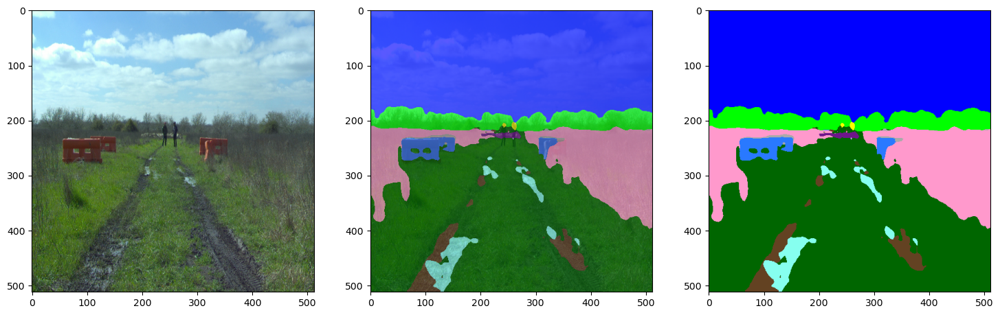

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


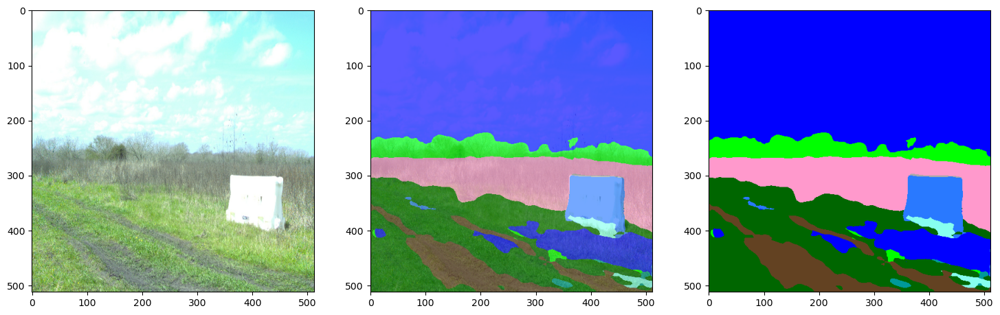

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


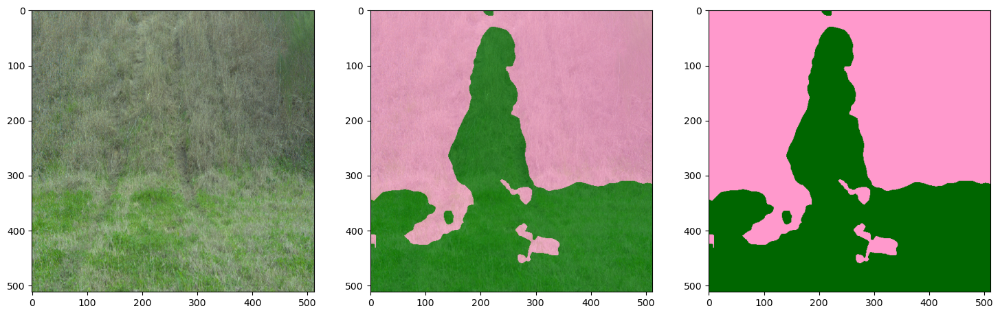

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


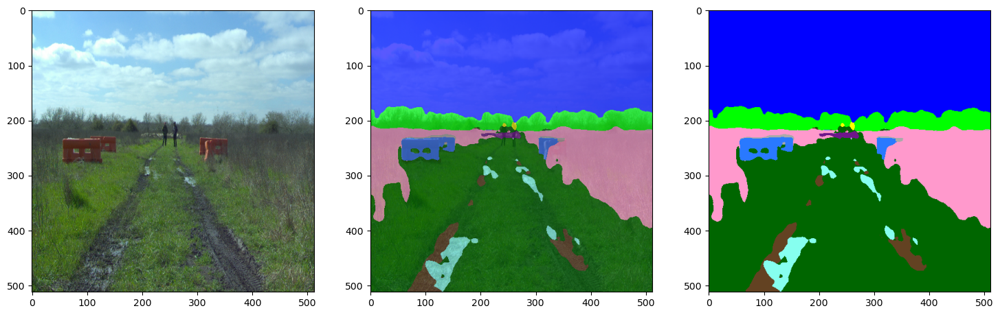

In [28]:
plot_predictions(train_images[:4], PALETTE, model=model)

## Inferencia en conjunto Test - con superposición de mapa de colores sobre RGB
Puede utilizar el modelo entrenado alojado en Hugging Face Hub y probar la demostración en Hugging Face Spaces.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


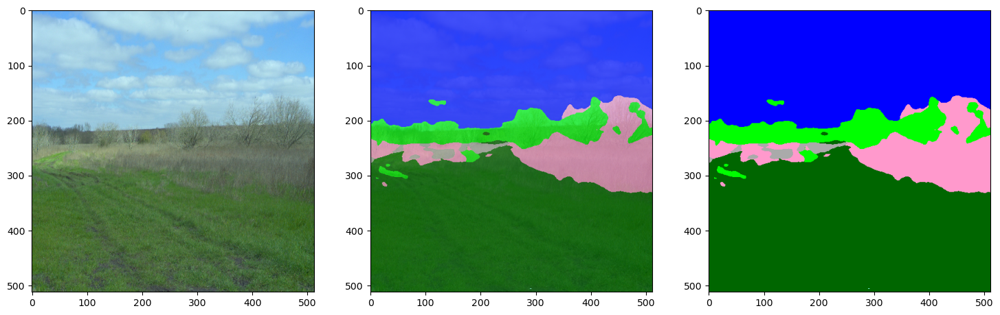

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step


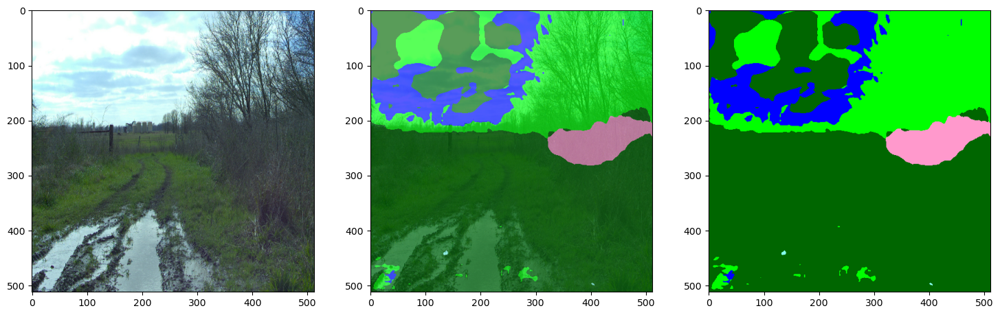

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


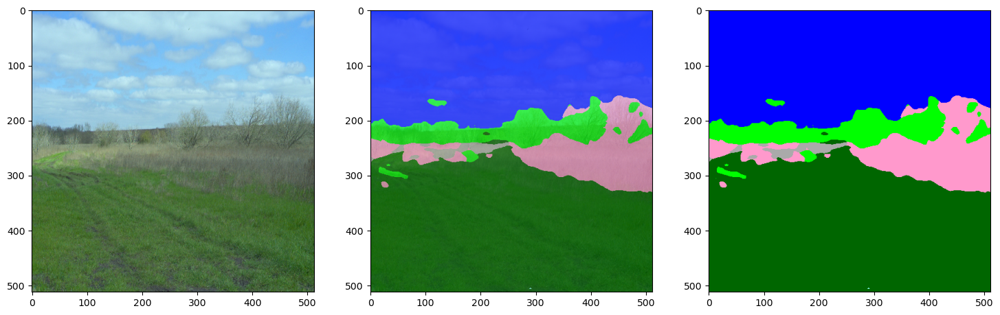

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


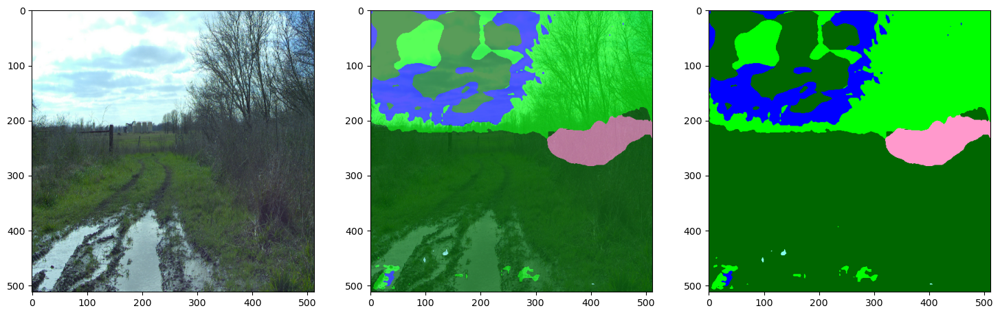

In [29]:
plot_predictions(test_images[:4], PALETTE, model=model)

## Guardar modelo con predicciones

In [24]:
# tf.saved_model.save(model, './model/Test_4.2_RDeepLabV3+_Rellis20_pred')

INFO:tensorflow:Assets written to: ./model/Test3_RDeepLabV3+_RellisAll_pred\assets


INFO:tensorflow:Assets written to: ./model/Test3_RDeepLabV3+_RellisAll_pred\assets


## Inferencia comparando la máscara GT RGB con la predicción convertida a RGB con mapa de colores

#### Conjunto de test cargado anteriormente
- test_images = sorted(glob(os.path.join(TEST_DIR, "images/*")))
- test_masks = sorted(glob(os.path.join(TEST_DIR, "labels/*")))
- test_maskscolors = sorted(glob(os.path.join(TEST_DIR, "masks_colors/*")))

In [30]:
# Seleccionar imágenes RGB del conjunto de test
for filename in test_images[:4]:
    print(filename)

./rellis20/test\images\frame000000-1581623790_349.jpg
./rellis20/test\images\frame000000-1581624652_750.jpg
./rellis20/test\images\frame000002-1581623790_549.jpg
./rellis20/test\images\frame000002-1581624652_949.jpg


In [31]:
# Seleccionar máscaras ID del conjunto de test
for filename in test_masks[:4]:
    print(filename)

./rellis20/test\labels\frame000000-1581623790_349_20.png
./rellis20/test\labels\frame000000-1581624652_750_20.png
./rellis20/test\labels\frame000002-1581623790_549_20.png
./rellis20/test\labels\frame000002-1581624652_949_20.png


In [32]:
for filename in test_maskscolors[:4]:
    print(filename)

./rellis20/test\masks_colors\frame000000-1581623790_349.png
./rellis20/test\masks_colors\frame000000-1581624652_750.png
./rellis20/test\masks_colors\frame000002-1581623790_549.png
./rellis20/test\masks_colors\frame000002-1581624652_949.png


In [33]:
# Predicción de MaskID - Mostrar RGB vs GT MaskID original vs Predicción maskID
def plot_MaskID_GTvsPred(images_list, mask_id, model):
    aux=0
    for image_file in images_list:
        image_tensor = read_image(image_file)                            # Read RGB test image
        mask_id_gt = read_image(mask_id[aux], mask=True)                 # Ground Truth MaskID
        pred_mask_id = infer(image_tensor=image_tensor, model=model)     # Predicted MaskID
        
        #prediction_colormap = decode_segmentation_masks(prediction_mask, colormap, NUM_CLASSES)
        #overlay = get_overlay(image_tensor, prediction_colormap)
        plot_samples_matplotlib(
            [image_tensor, mask_id_gt, pred_mask_id], figsize=(18, 14)
        )
        aux+=1
        
# Predicción de MaskColor - Mostrar RGB vs GT MaskColor vs Predicción maskID superpuesta con mapa de colores
def plot_MaskColor_GTvsPred(images_list, mask_color, model):
    aux=0
    for image_file in images_list:
        image_tensor = read_image(image_file)                            # Read RGB test image
        mask_color_gt = read_image(mask_color[aux])                      # Ground Truth MaskColor
        pred_mask_id = infer(image_tensor=image_tensor, model=model)     # Predicted MaskID
        pred_mask_color = decode_segmentation_masks(pred_mask_id, PALETTE, NUM_CLASSES)   # Convert predicted maskID to maskcolor

        plot_samples_matplotlib(
            [image_tensor, mask_color_gt, pred_mask_color], figsize=(18, 14)
        )
        aux+=1
     

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


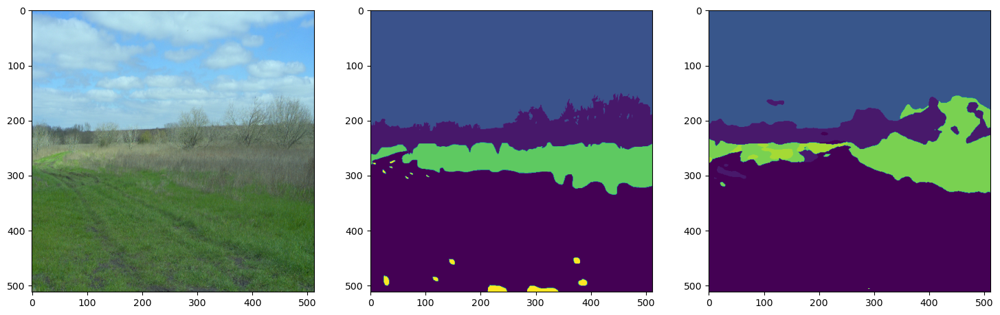

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


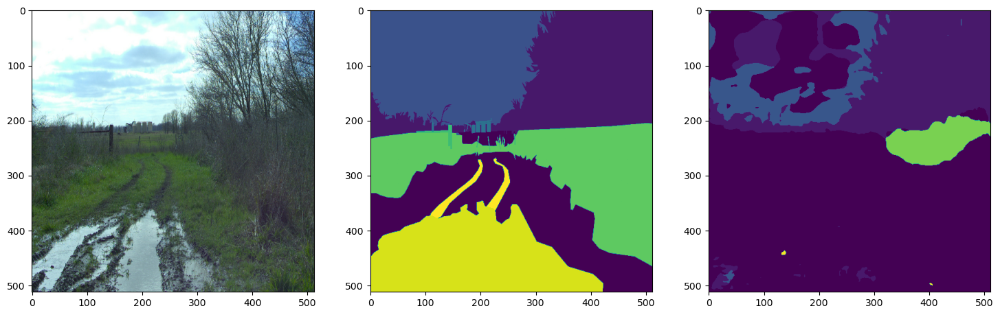

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


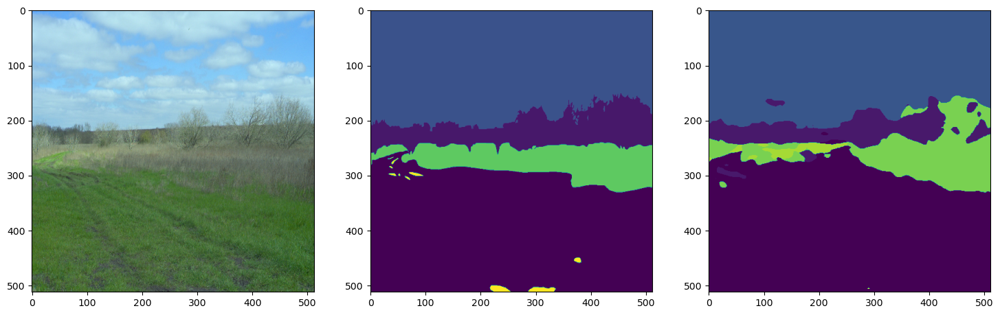

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


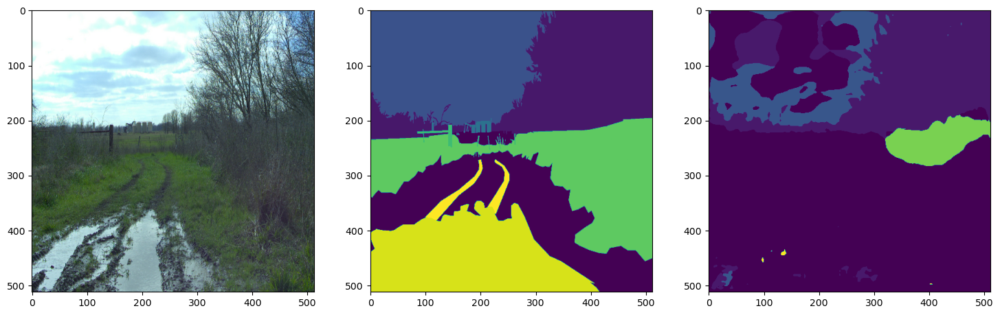

In [34]:
plot_MaskID_GTvsPred(test_images[:4], test_masks[:4], model=model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


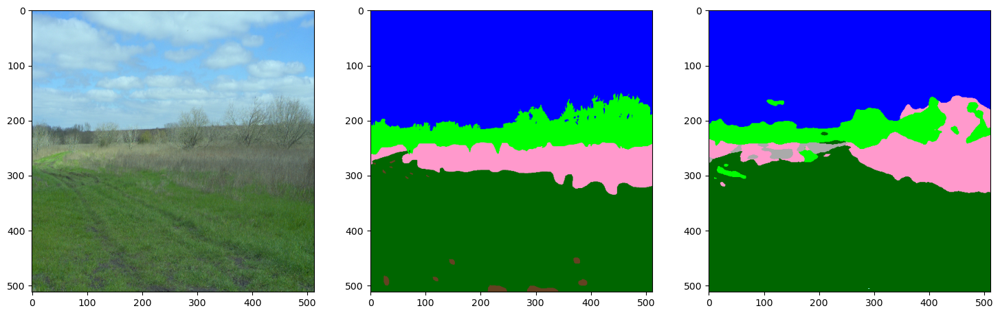

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


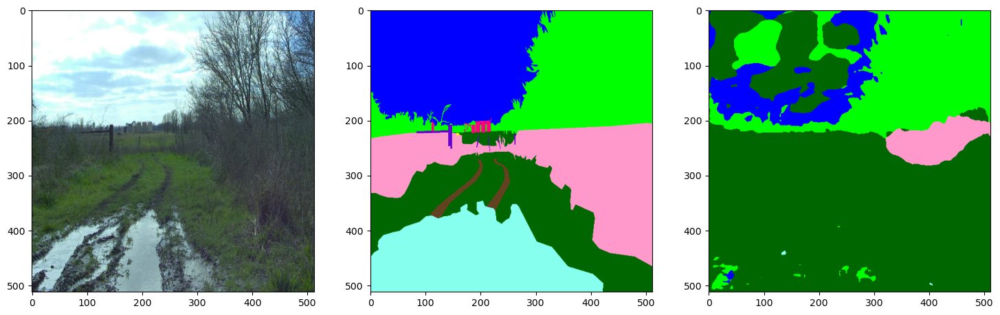

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


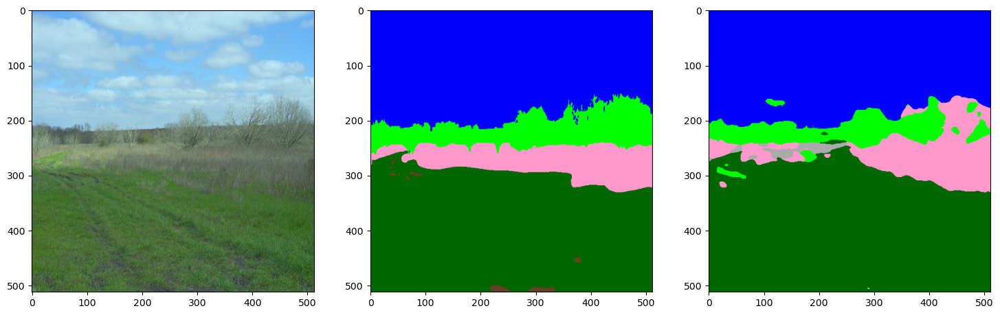

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


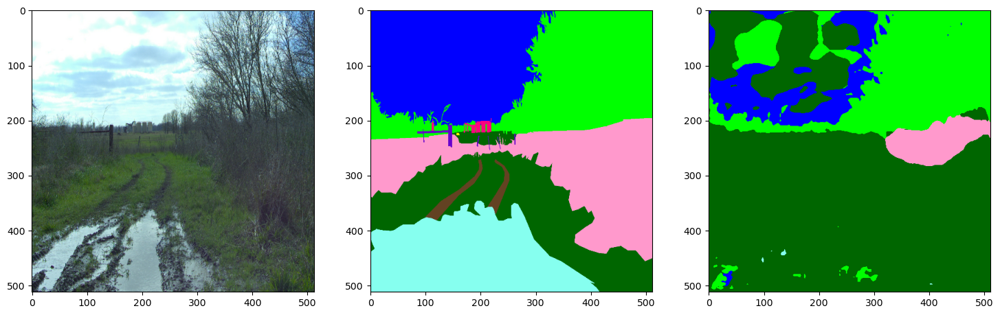

In [35]:
plot_MaskColor_GTvsPred(test_images[:4], test_maskscolors[:4], model=model)

## Inferencia en conjunto de Test completo

In [36]:
def inference_maskID(RGB_image_list, model):
    aux=0
    pred_masks_id=[]
    for image_file in RGB_image_list:
        image_tensor = read_image(image_file)                            # Read RGB test image
        pred_mask_id = infer(image_tensor=image_tensor, model=model)     # Predicted MaskID
        pred_masks_id.append(pred_mask_id)
        aux+=1
    return pred_masks_id

def inference_maskColor(RGB_image_list, model):
    aux=0
    pred_masks_color=[]
    for image_file in RGB_image_list:
        image_tensor = read_image(image_file)                            # Read RGB test image
        pred_mask_id = infer(image_tensor=image_tensor, model=model)     # Predicted MaskID
        pred_mask_color = decode_segmentation_masks(pred_mask_id, PALETTE, NUM_CLASSES)   # Convert predicted maskID to maskcolor
        pred_masks_color.append(pred_mask_color)
        aux+=1
    return pred_masks_color

In [37]:
pred_masksID = inference_maskID(test_images, model)
pred_masksColor = inference_maskColor(test_images,model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

### Check the RGB and masks image shapes

In [87]:
# RGB Test image
RGB0 = read_image(test_images[0])   
print(RGB0.shape)

# Test GT maskID
maskID0 = read_image(test_masks[0], mask=True)   
print(maskID0.shape)

# Test GT maskColor
maskColor0 = read_image(test_maskscolors[0])
print(maskColor0.shape)

# Predicted test maskID
print(pred_masksID[0].shape)

# Predicted test maskColor
print(pred_masksColor[0].shape)

(512, 512, 3)
(512, 512, 1)
(512, 512, 3)
(512, 512)
(512, 512, 3)


## Métricas

In [125]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

def extract_mask_label(mask, pred, ind):
    maskID = [(mask == ind)]
    predID = [(pred == ind)]
    mask_ID = np.stack(maskID, axis=-1).astype('float').flatten()
    pred_maskID = np.stack(predID, axis=-1).astype('float').flatten()
    return mask_ID, pred_maskID
    
def plot_confusion_matrix(cm, labels):
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
    disp.plot()
    plt.show()


In [126]:
def compute_metrics(confusionmatrix):
    FP = confusionmatrix.sum(axis=0) - np.diag(confusionmatrix)  
    FN = confusionmatrix.sum(axis=1) - np.diag(confusionmatrix)
    TP = np.diag(confusionmatrix)
    TN = confusionmatrix.sum() - (FP + FN + TP)
    
    # Precision or positive predictive value
    PPV = TP/(TP+FP)    # Precision
    
    # Sensitivity, hit rate, recall, or true positive rate
    TPR = TP/(TP+FN)    # Recall
    
    # F1-Score
    F1_Score=(2*(PPV*TPR))/(PPV+TPR)
    
    # Specificity or true negative rate
    TNR = TN/(TN+FP) 
    
    # Negative predictive value
    NPV = TN/(TN+FN)
    
    # Fall out or false positive rate
    FPR = FP/(FP+TN)
    # False negative rate
    FNR = FN/(TP+FN)
    # False discovery rate
    FDR = FP/(TP+FP)
    
    # Overall accuracy
    ACC = (TP+TN)/(TP+FP+FN+TN)

    # Para la clase 
    print('TP:', TP)
    print('TN:', TN)
    print('FP:', FP)
    print('FN:', FN)
    
    print('+ predictive value (Precision): ',PPV) 
    print('- predictive value: ', NPV)
    print('Recall: ', TPR) 
    print('F1-Score: ', F1_Score)
    print('True + rate: ', TNR)
    print('False + rate: ', FPR)
    print('False - rate', FNR)
    print('False discovery rate: ', FDR)
    print('Overall Accuracy: ', ACC)
    return 

De la primera imagen cargada del conjunto de test, sabemos seguro que tiene pixels de la clase grass (id=2) y sky (id=6). Tambien sabemos que no tiene pixeles de la clase vehicle (id=7)

In [129]:
# first image
maskID = read_image(test_masks[0], mask=True)   
maskID0 = np.reshape(maskID,(512,512))
pred_maskID0 = np.reshape(pred_masksID[0],(512,512))

print(maskID0.shape)
print(pred_maskID0.shape)

print(maskID0)
print(pred_maskID0)

# Seleccionar la máscara GT y predicción de la clase grass (id=2)
gra_maskID, pred_gra_maskID = extract_mask_label(maskID0, pred_maskID0, 2)

print(gra_maskID.shape)
print(gra_maskID)
print(pred_gra_maskID.shape)
print(pred_gra_maskID)

# Seleccionar la máscara GT y predicción de la clase sky (id=6)
maskID = [(maskID0 == 6)]
pred_maskID = [(pred_maskID0 == 6)]
sky_maskID = np.stack(maskID, axis=-1).astype('float').flatten()
pred_sky_maskID = np.stack(pred_maskID, axis=-1).astype('float').flatten()

# Seleccionar la máscara GT y predicción de la clase vehicle (id=7)
maskID = [(maskID0 == 7)]
pred_maskID = [(pred_maskID0 == 7)]
veh_maskID = np.stack(maskID, axis=-1).astype('float').flatten()
pred_veh_maskID = np.stack(pred_maskID, axis=-1).astype('float').flatten()

#IDs =    [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 12, 15, 17, 18, 19, 23, 27, 31, 33, 34]
#Groups = (0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19)
#CLASSES = ("void", "dirt", "grass", "tree", "pole", "water", "sky", "vehicle", 
#            "object", "asphalt", "building", "log", "person", "fence", "bush", 
#            "concrete", "barrier", "puddle", "mud", "rubble")

(512, 512)
(512, 512)
[[6. 6. 6. ... 6. 6. 6.]
 [6. 6. 6. ... 6. 6. 6.]
 [6. 6. 6. ... 6. 6. 6.]
 ...
 [2. 2. 2. ... 2. 2. 2.]
 [2. 2. 2. ... 2. 2. 2.]
 [2. 2. 2. ... 2. 2. 2.]]
[[6 6 6 ... 6 6 6]
 [6 6 6 ... 6 6 6]
 [6 6 6 ... 6 6 6]
 ...
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]]
(262144,)
[0. 0. 0. ... 1. 1. 1.]
(262144,)
[0. 0. 0. ... 1. 1. 1.]


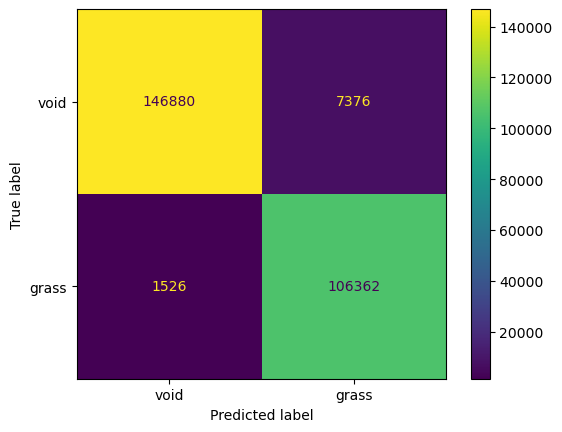

TP: [146880 106362]
TN: [106362 146880]
FP: [1526 7376]
FN: [7376 1526]
+ predictive value (Precision):  [0.9897174 0.9351492]
- predictive value:  [0.9351492 0.9897174]
Recall:  [0.95218338 0.9858557 ]
F1-Score:  [0.97058765 0.95983323]
True + rate:  [0.9858557  0.95218338]
False + rate:  [0.0141443  0.04781662]
False - rate [0.04781662 0.0141443 ]
False discovery rate:  [0.0102826 0.0648508]
Overall Accuracy:  [0.96604156 0.96604156]


In [130]:
# Para la clase 2 grass
conf_matrix = confusion_matrix(gra_maskID, pred_gra_maskID)
plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[2]))
compute_metrics(conf_matrix)

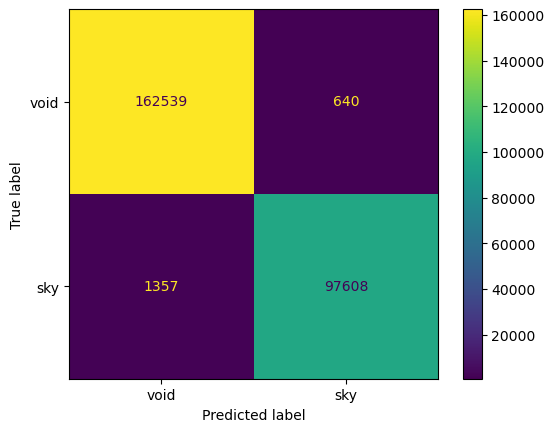

TP: [162539  97608]
TN: [ 97608 162539]
FP: [1357  640]
FN: [ 640 1357]
+ predictive value (Precision):  [0.99172036 0.99348587]
- predictive value:  [0.99348587 0.99172036]
Recall:  [0.99607793 0.98628808]
F1-Score:  [0.99389437 0.98987389]
True + rate:  [0.98628808 0.99607793]
False + rate:  [0.01371192 0.00392207]
False - rate [0.00392207 0.01371192]
False discovery rate:  [0.00827964 0.00651413]
Overall Accuracy:  [0.99238205 0.99238205]


In [146]:
# Para la clase 6 sky 
conf_matrix = confusion_matrix(sky_maskID, pred_sky_maskID)
plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[6]))
compute_metrics(conf_matrix)

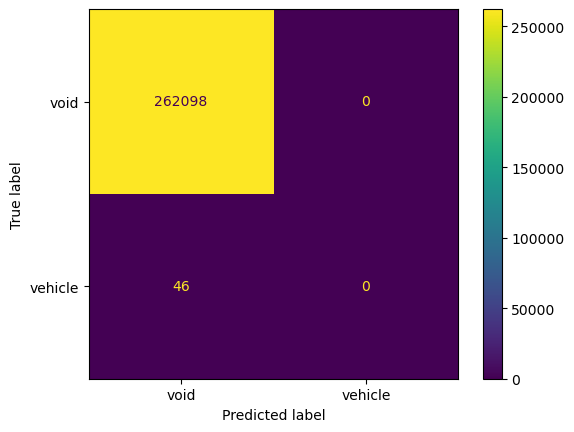

TP: [262098      0]
TN: [     0 262098]
FP: [46  0]
FN: [ 0 46]
+ predictive value (Precision):  [0.99982452        nan]
- predictive value:  [       nan 0.99982452]
Recall:  [1. 0.]
F1-Score:  [0.99991225        nan]
True + rate:  [0. 1.]
False + rate:  [1. 0.]
False - rate [0. 1.]
False discovery rate:  [0.00017548        nan]
Overall Accuracy:  [0.99982452 0.99982452]


In [132]:
# Para la clase 7 vehicle 
conf_matrix = confusion_matrix(veh_maskID, pred_veh_maskID)
plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[7]))
compute_metrics(conf_matrix)

## Metrics for all labels in the same image

In [147]:
# first image
maskID = read_image(test_masks[0], mask=True)   
maskID0 = np.reshape(maskID,(512,512))
pred_maskID0 = np.reshape(pred_masksID[0],(512,512))

gtmaskID0, p_maskID0 = extract_mask_label(maskID0, pred_maskID0, 0)
gtmaskID1, p_maskID1 = extract_mask_label(maskID0, pred_maskID0, 1)
gtmaskID2, p_maskID2 = extract_mask_label(maskID0, pred_maskID0, 2)
gtmaskID3, p_maskID3 = extract_mask_label(maskID0, pred_maskID0, 3)
gtmaskID4, p_maskID4 = extract_mask_label(maskID0, pred_maskID0, 4)
gtmaskID5, p_maskID5 = extract_mask_label(maskID0, pred_maskID0, 5)
gtmaskID6, p_maskID6 = extract_mask_label(maskID0, pred_maskID0, 6)
gtmaskID7, p_maskID7 = extract_mask_label(maskID0, pred_maskID0, 7)
gtmaskID8, p_maskID8 = extract_mask_label(maskID0, pred_maskID0, 8)
gtmaskID9, p_maskID9 = extract_mask_label(maskID0, pred_maskID0, 9)
gtmaskID10, p_maskID10 = extract_mask_label(maskID0, pred_maskID0, 10)
gtmaskID11, p_maskID11 = extract_mask_label(maskID0, pred_maskID0, 11)
gtmaskID12, p_maskID12 = extract_mask_label(maskID0, pred_maskID0, 12)
gtmaskID13, p_maskID13 = extract_mask_label(maskID0, pred_maskID0, 13)
gtmaskID14, p_maskID14 = extract_mask_label(maskID0, pred_maskID0, 14)
gtmaskID15, p_maskID15 = extract_mask_label(maskID0, pred_maskID0, 15)
gtmaskID16, p_maskID16 = extract_mask_label(maskID0, pred_maskID0, 16)
gtmaskID17, p_maskID17 = extract_mask_label(maskID0, pred_maskID0, 17)
gtmaskID18, p_maskID18 = extract_mask_label(maskID0, pred_maskID0, 18)
gtmaskID19, p_maskID19 = extract_mask_label(maskID0, pred_maskID0, 19)


In [149]:
# void da error
conf_matrix = confusion_matrix(gtmaskID0.flatten(), p_maskID0.flatten())
#plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[0]))
compute_metrics(conf_matrix)

TP: [262144]
TN: [0]
FP: [0]
FN: [0]
+ predictive value (Precision):  [1.]
- predictive value:  [nan]
Recall:  [1.]
F1-Score:  [1.]
True + rate:  [nan]
False + rate:  [nan]
False - rate [0.]
False discovery rate:  [0.]
Overall Accuracy:  [1.]


In [150]:
# dirt da error
conf_matrix = confusion_matrix(gtmaskID1.flatten(), p_maskID1.flatten())
#plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[1]))
compute_metrics(conf_matrix)

TP: [262144]
TN: [0]
FP: [0]
FN: [0]
+ predictive value (Precision):  [1.]
- predictive value:  [nan]
Recall:  [1.]
F1-Score:  [1.]
True + rate:  [nan]
False + rate:  [nan]
False - rate [0.]
False discovery rate:  [0.]
Overall Accuracy:  [1.]


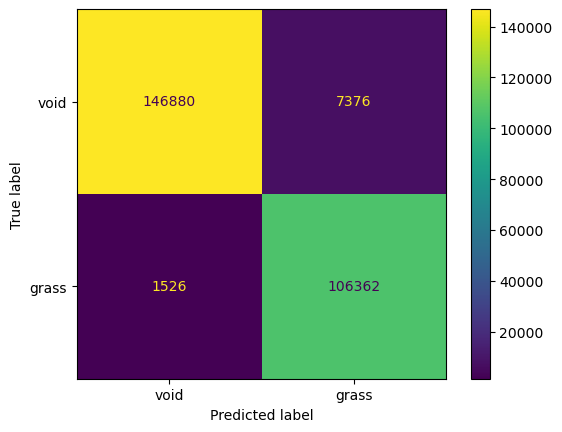

TP: [146880 106362]
TN: [106362 146880]
FP: [1526 7376]
FN: [7376 1526]
+ predictive value (Precision):  [0.9897174 0.9351492]
- predictive value:  [0.9351492 0.9897174]
Recall:  [0.95218338 0.9858557 ]
F1-Score:  [0.97058765 0.95983323]
True + rate:  [0.9858557  0.95218338]
False + rate:  [0.0141443  0.04781662]
False - rate [0.04781662 0.0141443 ]
False discovery rate:  [0.0102826 0.0648508]
Overall Accuracy:  [0.96604156 0.96604156]


In [151]:
# grass
conf_matrix = confusion_matrix(gtmaskID2.flatten(), p_maskID2.flatten())
plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[2]))
compute_metrics(conf_matrix)

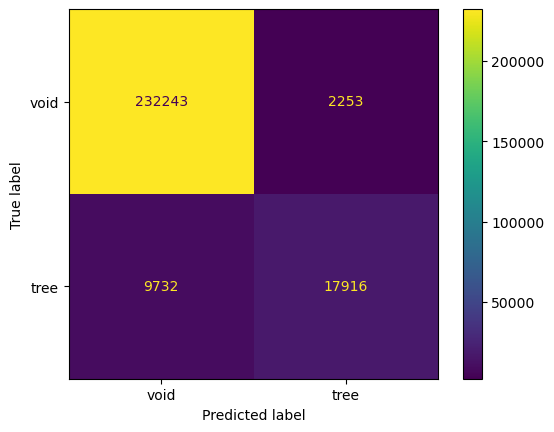

TP: [232243  17916]
TN: [ 17916 232243]
FP: [9732 2253]
FN: [2253 9732]
+ predictive value (Precision):  [0.95978097 0.88829392]
- predictive value:  [0.88829392 0.95978097]
Recall:  [0.99039216 0.64800347]
F1-Score:  [0.97484632 0.74935692]
True + rate:  [0.64800347 0.99039216]
False + rate:  [0.35199653 0.00960784]
False - rate [0.00960784 0.35199653]
False discovery rate:  [0.04021903 0.11170608]
Overall Accuracy:  [0.95428085 0.95428085]


In [152]:
# tree
conf_matrix = confusion_matrix(gtmaskID3.flatten(), p_maskID3.flatten())
plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[3]))
compute_metrics(conf_matrix)

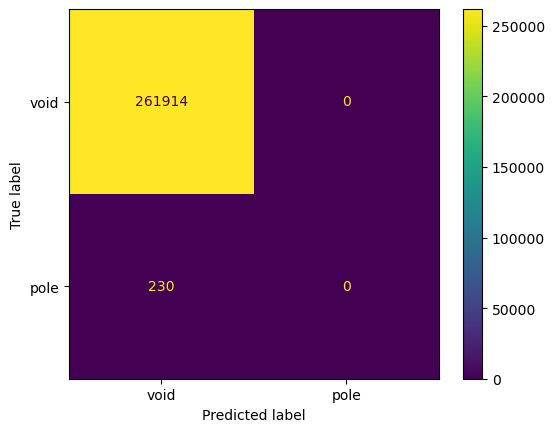

TP: [261914      0]
TN: [     0 261914]
FP: [230   0]
FN: [  0 230]
+ predictive value (Precision):  [0.99912262        nan]
- predictive value:  [       nan 0.99912262]
Recall:  [1. 0.]
F1-Score:  [0.99956112        nan]
True + rate:  [0. 1.]
False + rate:  [1. 0.]
False - rate [0. 1.]
False discovery rate:  [0.00087738        nan]
Overall Accuracy:  [0.99912262 0.99912262]


In [153]:
# pole
conf_matrix = confusion_matrix(gtmaskID4.flatten(), p_maskID4.flatten())
plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[4]))
compute_metrics(conf_matrix)

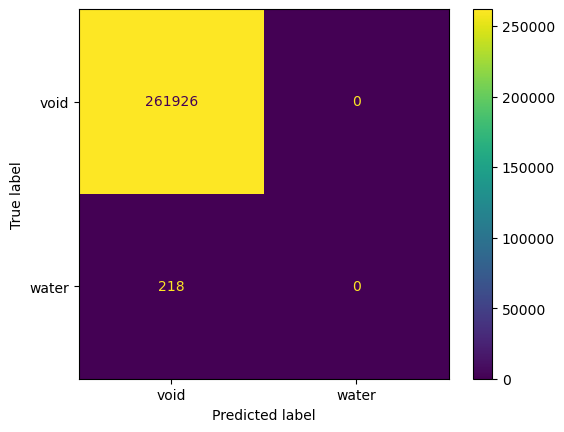

TP: [261926      0]
TN: [     0 261926]
FP: [218   0]
FN: [  0 218]
+ predictive value (Precision):  [0.9991684       nan]
- predictive value:  [      nan 0.9991684]
Recall:  [1. 0.]
F1-Score:  [0.99958403        nan]
True + rate:  [0. 1.]
False + rate:  [1. 0.]
False - rate [0. 1.]
False discovery rate:  [0.0008316       nan]
Overall Accuracy:  [0.9991684 0.9991684]


In [155]:
# water
conf_matrix = confusion_matrix(gtmaskID5.flatten(), p_maskID5.flatten())
plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[5]))
compute_metrics(conf_matrix)

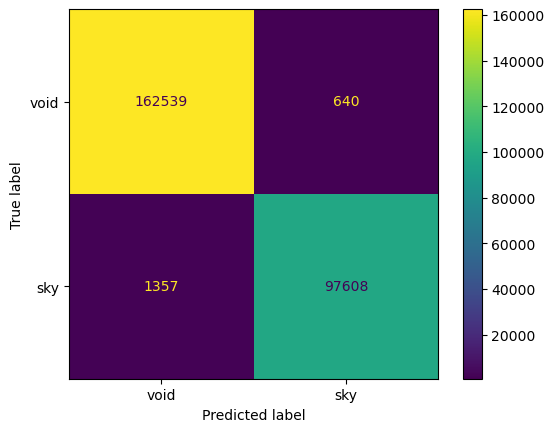

TP: [162539  97608]
TN: [ 97608 162539]
FP: [1357  640]
FN: [ 640 1357]
+ predictive value (Precision):  [0.99172036 0.99348587]
- predictive value:  [0.99348587 0.99172036]
Recall:  [0.99607793 0.98628808]
F1-Score:  [0.99389437 0.98987389]
True + rate:  [0.98628808 0.99607793]
False + rate:  [0.01371192 0.00392207]
False - rate [0.00392207 0.01371192]
False discovery rate:  [0.00827964 0.00651413]
Overall Accuracy:  [0.99238205 0.99238205]


In [156]:
# sky
conf_matrix = confusion_matrix(gtmaskID6.flatten(), p_maskID6.flatten())
plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[6]))
compute_metrics(conf_matrix)

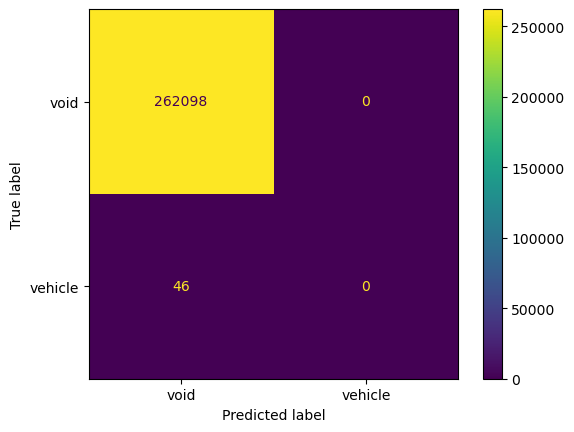

TP: [262098      0]
TN: [     0 262098]
FP: [46  0]
FN: [ 0 46]
+ predictive value (Precision):  [0.99982452        nan]
- predictive value:  [       nan 0.99982452]
Recall:  [1. 0.]
F1-Score:  [0.99991225        nan]
True + rate:  [0. 1.]
False + rate:  [1. 0.]
False - rate [0. 1.]
False discovery rate:  [0.00017548        nan]
Overall Accuracy:  [0.99982452 0.99982452]


In [157]:
# vehicle
conf_matrix = confusion_matrix(gtmaskID7.flatten(), p_maskID7.flatten())
plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[7]))
compute_metrics(conf_matrix)

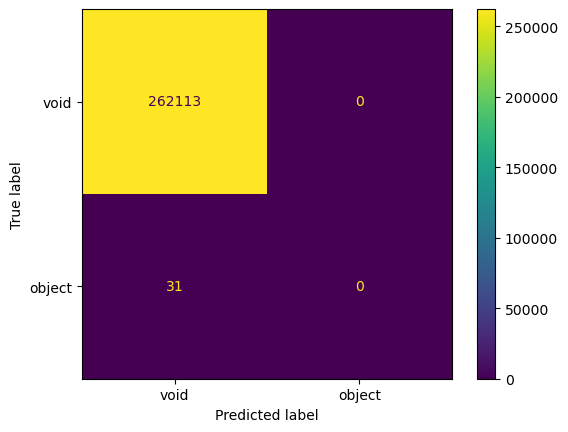

TP: [262113      0]
TN: [     0 262113]
FP: [31  0]
FN: [ 0 31]
+ predictive value (Precision):  [0.99988174        nan]
- predictive value:  [       nan 0.99988174]
Recall:  [1. 0.]
F1-Score:  [0.99994087        nan]
True + rate:  [0. 1.]
False + rate:  [1. 0.]
False - rate [0. 1.]
False discovery rate:  [0.00011826        nan]
Overall Accuracy:  [0.99988174 0.99988174]


In [158]:
# object
conf_matrix = confusion_matrix(gtmaskID8.flatten(), p_maskID8.flatten())
plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[8]))
compute_metrics(conf_matrix)

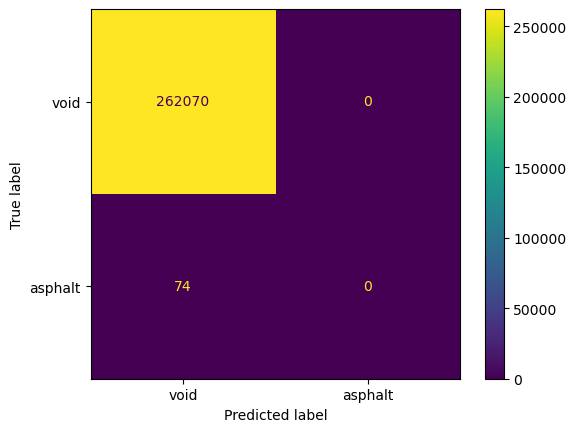

TP: [262070      0]
TN: [     0 262070]
FP: [74  0]
FN: [ 0 74]
+ predictive value (Precision):  [0.99971771        nan]
- predictive value:  [       nan 0.99971771]
Recall:  [1. 0.]
F1-Score:  [0.99985884        nan]
True + rate:  [0. 1.]
False + rate:  [1. 0.]
False - rate [0. 1.]
False discovery rate:  [0.00028229        nan]
Overall Accuracy:  [0.99971771 0.99971771]


In [159]:
# asphalt
conf_matrix = confusion_matrix(gtmaskID9.flatten(), p_maskID9.flatten())
plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[9]))
compute_metrics(conf_matrix)

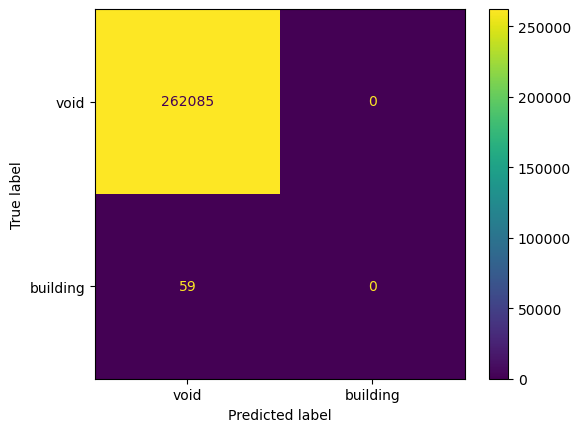

TP: [262085      0]
TN: [     0 262085]
FP: [59  0]
FN: [ 0 59]
+ predictive value (Precision):  [0.99977493        nan]
- predictive value:  [       nan 0.99977493]
Recall:  [1. 0.]
F1-Score:  [0.99988745        nan]
True + rate:  [0. 1.]
False + rate:  [1. 0.]
False - rate [0. 1.]
False discovery rate:  [0.00022507        nan]
Overall Accuracy:  [0.99977493 0.99977493]


In [160]:
# building
conf_matrix = confusion_matrix(gtmaskID10.flatten(), p_maskID10.flatten())
plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[10]))
compute_metrics(conf_matrix)

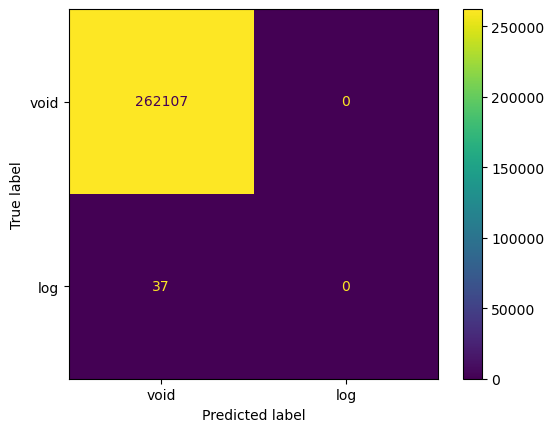

TP: [262107      0]
TN: [     0 262107]
FP: [37  0]
FN: [ 0 37]
+ predictive value (Precision):  [0.99985886        nan]
- predictive value:  [       nan 0.99985886]
Recall:  [1. 0.]
F1-Score:  [0.99992942        nan]
True + rate:  [0. 1.]
False + rate:  [1. 0.]
False - rate [0. 1.]
False discovery rate:  [0.00014114        nan]
Overall Accuracy:  [0.99985886 0.99985886]


In [161]:
# log
conf_matrix = confusion_matrix(gtmaskID11.flatten(), p_maskID11.flatten())
plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[11]))
compute_metrics(conf_matrix)

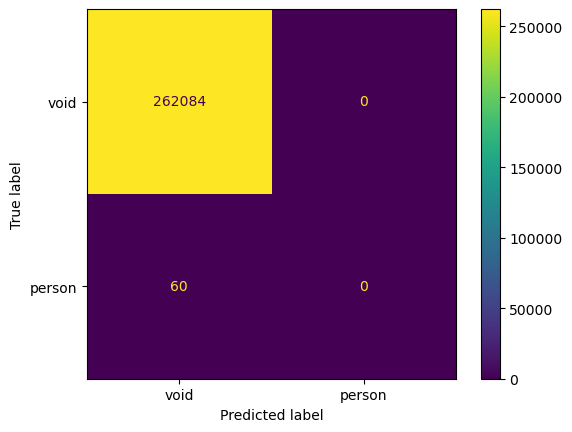

TP: [262084      0]
TN: [     0 262084]
FP: [60  0]
FN: [ 0 60]
+ predictive value (Precision):  [0.99977112        nan]
- predictive value:  [       nan 0.99977112]
Recall:  [1. 0.]
F1-Score:  [0.99988555        nan]
True + rate:  [0. 1.]
False + rate:  [1. 0.]
False - rate [0. 1.]
False discovery rate:  [0.00022888        nan]
Overall Accuracy:  [0.99977112 0.99977112]


In [162]:
# person
conf_matrix = confusion_matrix(gtmaskID12.flatten(), p_maskID12.flatten())
plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[12]))
compute_metrics(conf_matrix)

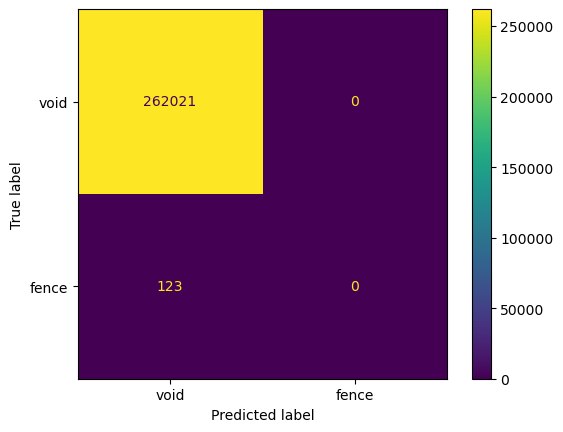

TP: [262021      0]
TN: [     0 262021]
FP: [123   0]
FN: [  0 123]
+ predictive value (Precision):  [0.99953079        nan]
- predictive value:  [       nan 0.99953079]
Recall:  [1. 0.]
F1-Score:  [0.99976534        nan]
True + rate:  [0. 1.]
False + rate:  [1. 0.]
False - rate [0. 1.]
False discovery rate:  [0.00046921        nan]
Overall Accuracy:  [0.99953079 0.99953079]


In [163]:
# fence
conf_matrix = confusion_matrix(gtmaskID13.flatten(), p_maskID13.flatten())
plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[13]))
compute_metrics(conf_matrix)

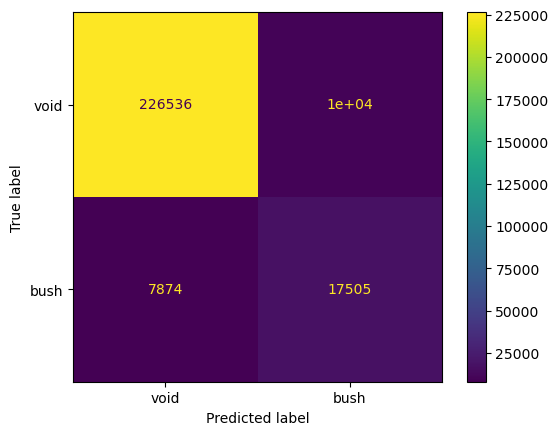

TP: [226536  17505]
TN: [ 17505 226536]
FP: [ 7874 10229]
FN: [10229  7874]
+ predictive value (Precision):  [0.96640928 0.63117473]
- predictive value:  [0.63117473 0.96640928]
Recall:  [0.95679682 0.68974349]
F1-Score:  [0.96157903 0.65916066]
True + rate:  [0.68974349 0.95679682]
False + rate:  [0.31025651 0.04320318]
False - rate [0.04320318 0.31025651]
False discovery rate:  [0.03359072 0.36882527]
Overall Accuracy:  [0.93094254 0.93094254]


In [164]:
# bush
conf_matrix = confusion_matrix(gtmaskID14.flatten(), p_maskID14.flatten())
plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[14]))
compute_metrics(conf_matrix)

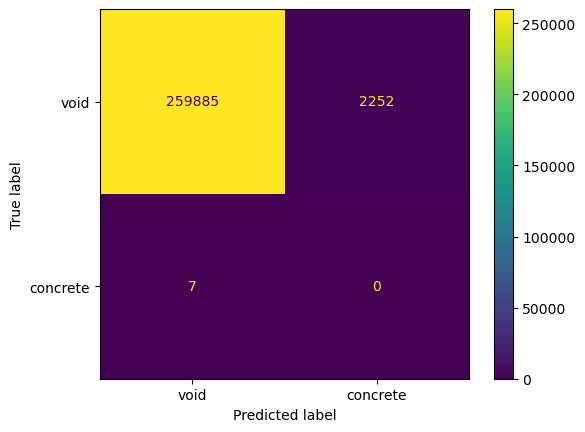

TP: [259885      0]
TN: [     0 259885]
FP: [   7 2252]
FN: [2252    7]
+ predictive value (Precision):  [0.99997307 0.        ]
- predictive value:  [0.         0.99997307]
Recall:  [0.99140907 0.        ]
F1-Score:  [0.99567265        nan]
True + rate:  [0.         0.99140907]
False + rate:  [1.         0.00859093]
False - rate [0.00859093 1.        ]
False discovery rate:  [2.6934265e-05 1.0000000e+00]
Overall Accuracy:  [0.9913826 0.9913826]


In [165]:
# concrete
conf_matrix = confusion_matrix(gtmaskID15.flatten(), p_maskID15.flatten())
plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[15]))
compute_metrics(conf_matrix)

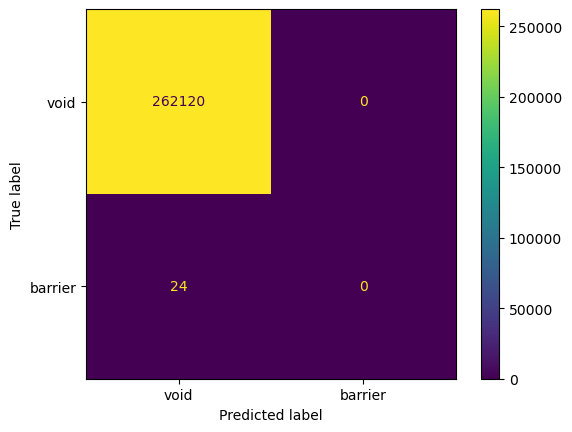

TP: [262120      0]
TN: [     0 262120]
FP: [24  0]
FN: [ 0 24]
+ predictive value (Precision):  [0.99990845        nan]
- predictive value:  [       nan 0.99990845]
Recall:  [1. 0.]
F1-Score:  [0.99995422        nan]
True + rate:  [0. 1.]
False + rate:  [1. 0.]
False - rate [0. 1.]
False discovery rate:  [9.15527344e-05            nan]
Overall Accuracy:  [0.99990845 0.99990845]


In [166]:
# barrier
conf_matrix = confusion_matrix(gtmaskID16.flatten(), p_maskID16.flatten())
plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[16]))
compute_metrics(conf_matrix)

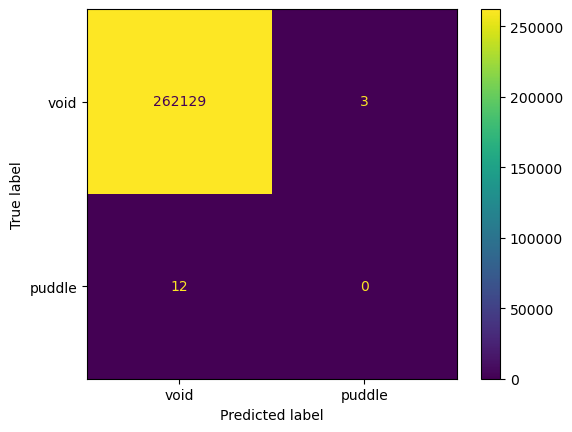

TP: [262129      0]
TN: [     0 262129]
FP: [12  3]
FN: [ 3 12]
+ predictive value (Precision):  [0.99995422 0.        ]
- predictive value:  [0.         0.99995422]
Recall:  [0.99998856 0.        ]
F1-Score:  [0.99997139        nan]
True + rate:  [0.         0.99998856]
False + rate:  [1.00000000e+00 1.14446157e-05]
False - rate [1.14446157e-05 1.00000000e+00]
False discovery rate:  [4.57768911e-05 1.00000000e+00]
Overall Accuracy:  [0.99994278 0.99994278]


In [167]:
# puddle
conf_matrix = confusion_matrix(gtmaskID17.flatten(), p_maskID17.flatten())
plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[17]))
compute_metrics(conf_matrix)

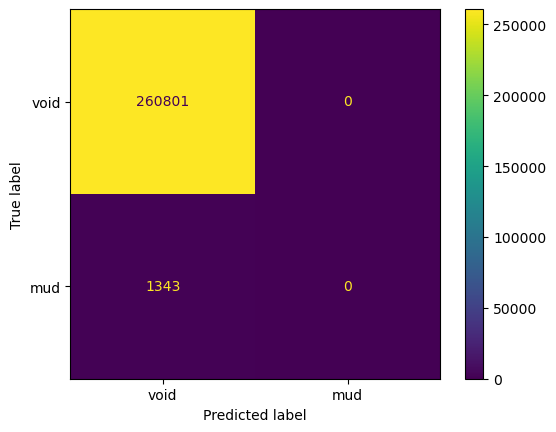

TP: [260801      0]
TN: [     0 260801]
FP: [1343    0]
FN: [   0 1343]
+ predictive value (Precision):  [0.99487686        nan]
- predictive value:  [       nan 0.99487686]
Recall:  [1. 0.]
F1-Score:  [0.99743185        nan]
True + rate:  [0. 1.]
False + rate:  [1. 0.]
False - rate [0. 1.]
False discovery rate:  [0.00512314        nan]
Overall Accuracy:  [0.99487686 0.99487686]


In [168]:
# mud
conf_matrix = confusion_matrix(gtmaskID18.flatten(), p_maskID18.flatten())
plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[18]))
compute_metrics(conf_matrix)

In [170]:
# da error rubble
conf_matrix = confusion_matrix(gtmaskID19.flatten(), p_maskID19.flatten())
#plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[19]))
compute_metrics(conf_matrix)

TP: [262144]
TN: [0]
FP: [0]
FN: [0]
+ predictive value (Precision):  [1.]
- predictive value:  [nan]
Recall:  [1.]
F1-Score:  [1.]
True + rate:  [nan]
False + rate:  [nan]
False - rate [0.]
False discovery rate:  [0.]
Overall Accuracy:  [1.]


## Otra forma de calcular TP, FP, y FN sin la confusion matrix

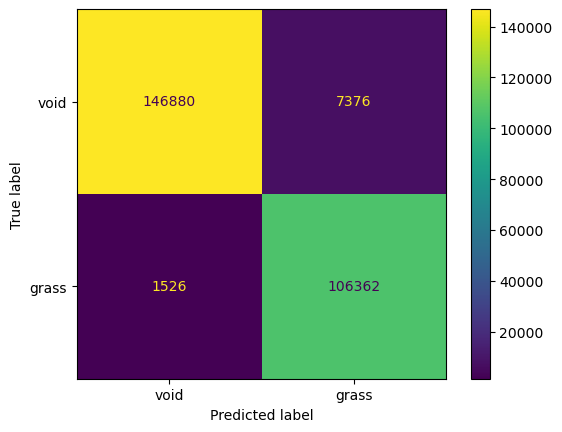

TP: [146880 106362]
TN: [106362 146880]
FP: [1526 7376]
FN: [7376 1526]
+ predictive value (Precision):  [0.9897174 0.9351492]
- predictive value:  [0.9351492 0.9897174]
Recall:  [0.95218338 0.9858557 ]
F1-Score:  [0.97058765 0.95983323]
True + rate:  [0.9858557  0.95218338]
False + rate:  [0.0141443  0.04781662]
False - rate [0.04781662 0.0141443 ]
False discovery rate:  [0.0102826 0.0648508]
Overall Accuracy:  [0.96604156 0.96604156]
New TP:  106362
New FP:  7376
New FN:  1526


In [182]:
# Para la clase id=2 grass, teníamos
# grass
conf_matrix = confusion_matrix(gtmaskID2.flatten(), p_maskID2.flatten())
plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[2]))
compute_metrics(conf_matrix)

# Calculando de nuevo
c=1
TP = np.sum((gtmaskID2 == c) & (p_maskID2 == c))
FP = np.sum((gtmaskID2 != c) & (p_maskID2 == c))
FN = np.sum((gtmaskID2 == c) & (p_maskID2 != c))
print('New TP: ', TP)
print('New FP: ', FP)
print('New FN: ', FN)

## Ahora usamos las máscaras sin filtrar por label

In [185]:
# Leear primera máscara GT y pre del conjunto de test y reshape
maskID = read_image(test_masks[0], mask=True)   
maskID0 = np.reshape(maskID,(512,512))
pred_maskID0 = np.reshape(pred_masksID[0],(512,512))

conf_matrix = confusion_matrix(gtmaskID2.flatten(), p_maskID2.flatten())
#plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[2]))
compute_metrics(conf_matrix)

# Calculando de nuevo
#Groups = (0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19)
for c in Groups:
    TP = np.sum((maskID0 == c) & (pred_maskID0 == c))
    FP = np.sum((maskID0 != c) & (pred_maskID0 == c))
    FN = np.sum((maskID0 == c) & (pred_maskID0 != c))
    PPV = TP / (TP + FP)  # Precision
    TPR = TP / (TP + FN)  # Recall
    F1 = (2*(PPV * TPR)) /  (PPV + TPR)
    print('Clase: ', CLASSES[c])
    print('New TP: ', TP)
    print('New FP: ', FP)
    print('New FN: ', FN)
    print('New Precision: ', PPV)
    print('New Recall: ', TPR)
    print('New F1-Score: ', F1)

TP: [146880 106362]
TN: [106362 146880]
FP: [1526 7376]
FN: [7376 1526]
+ predictive value (Precision):  [0.9897174 0.9351492]
- predictive value:  [0.9351492 0.9897174]
Recall:  [0.95218338 0.9858557 ]
F1-Score:  [0.97058765 0.95983323]
True + rate:  [0.9858557  0.95218338]
False + rate:  [0.0141443  0.04781662]
False - rate [0.04781662 0.0141443 ]
False discovery rate:  [0.0102826 0.0648508]
Overall Accuracy:  [0.96604156 0.96604156]
Clase:  void
New TP:  0
New FP:  0
New FN:  0
New Precision:  nan
New Recall:  nan
New F1-Score:  nan
Clase:  dirt
New TP:  0
New FP:  0
New FN:  0
New Precision:  nan
New Recall:  nan
New F1-Score:  nan
Clase:  grass
New TP:  106362
New FP:  7376
New FN:  1526
New Precision:  0.9351492025532364
New Recall:  0.985855702209699
New F1-Score:  0.9598332325629665
Clase:  tree
New TP:  17916
New FP:  2253
New FN:  9732
New Precision:  0.8882939164063662
New Recall:  0.6480034722222222
New F1-Score:  0.7493569232699667
Clase:  pole
New TP:  0
New FP:  0
New FN

Ahora calculamos las métricas anteriores para cada clase de la misma imagen y las guardamos en un dataframe

In [407]:
import pandas as pd

def check_isnan(metrics):
    nonan_metrics=[]
    newmetric=np.array(0)
    for metric in metrics:
        if np.isnan(metric) == True:  metric=0
        #metric=float(metric)
        metric2=np.around(metric, decimals=3)
        nonan_metrics.append(metric2)

    return nonan_metrics
    
def compute_simple_metrics(GTmaskID, PredmaskID):
    # Calculando de nuevo
    metrics_name=['TP','FP','FN','PPV','TPR','F1']
    Groups = (0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19)
    is_present=[]
    df = pd.DataFrame()

    for c in Groups:
        nonan_metrics=[]
        if c==0:
            header = pd.MultiIndex.from_product([[CLASSES[c]], 
                                                 ['TP','FP','FN','PPV','TPR','F1']], 
                                                names=['class','metric'])
        else:
            header = pd.MultiIndex.from_product([[CLASSES[c]], 
                                                 ['TP','FP','FN','PPV','TPR','F1']])
 
        TP = np.sum((GTmaskID == c) & (PredmaskID == c))
        FP = np.sum((GTmaskID != c) & (PredmaskID == c))
        FN = np.sum((GTmaskID == c) & (PredmaskID != c))
        PPV = TP / (TP + FP)  # Precision
        TPR = TP / (TP + FN)  # Recall
        F1 = (2*(PPV * TPR)) /  (PPV + TPR)
        if PPV > 0.6 or TPR > 0.6 or F1 > 0.6: is_present.append(CLASSES[c])
        nonan_metricsbyclass = check_isnan([TP,FP,FN,PPV,TPR,F1])
        nonan_metrics.append(nonan_metricsbyclass)
        if c==0:
            header = pd.MultiIndex.from_product([[CLASSES[c]], metrics_name],names=['class','metric'])
            df1 = pd.DataFrame(np.array(nonan_metrics), index=['a'], columns=header)
            df=df1
        else:
            header = pd.MultiIndex.from_product([[CLASSES[c]], metrics_name])
            df2 = pd.DataFrame(np.array(nonan_metrics), index=['a'], columns=header)
            df = pd.concat([df, df2],axis=1)
    return df, is_present

In [408]:
# first image
maskID = read_image(test_masks[0], mask=True)   
maskID0 = np.reshape(maskID,(512,512))
pred_maskID0 = np.reshape(pred_masksID[0],(512,512))
df, present = compute_simple_metrics(maskID0,pred_maskID0)
display(df)
print('Classes present in the image: ', test_masks[0],present)

void                  dirt            ...     mud                rubble     \
    TP FP FN PPV TPR F1   TP FP FN PPV  ...      FN  PPV  TPR   F1     TP FP   
a    0  0  0   0   0  0    0  0  0   0  ...  1343.0  0.0  0.0  0.0      0  0   

                 
  FN PPV TPR F1  
a  0   0   0  0  

[1 rows x 120 columns]

Classes present in the image:  ./rellis20/test\labels\frame000000-1581623790_349_20.png ['grass', 'tree', 'sky', 'bush']


____________________

- ¿Qué clases tiene el GT de la mascaraID de la primera imagen de test?
- ¿Cuándo consideramos que una clase existe, si la propia máscara puede tener error?
- cierto numero de pixels?
- 1000?
- ¿Qué métricas y qué threshold consideramos para decir que una clase está presente?
    - Precision and Recall and F1-Score > threshold ¿?
    - Precision or Recall or F1-Score > threshold ¿?
    - Otro?¿

In [409]:
for c in Groups:
    TP = np.sum((maskID0 == c) & (maskID0 == c))
    FP = np.sum((maskID0 != c) & (maskID0 == c))
    FN = np.sum((maskID0 == c) & (maskID0 != c))
    PPV = TP / (TP + FP)  # Precision
    TPR = TP / (TP + FN)  # Recall
    F1 = (2*(PPV * TPR)) /  (PPV + TPR)

    print('Clase: ', CLASSES[c])
    print('New TP: ', TP)
    print('New FP: ', FP)
    print('New FN: ', FN)
    print('New Precision: ', PPV)
    print('New Recall: ', TPR)
    print('New F1-Score: ', F1)

Clase:  void
New TP:  0
New FP:  0
New FN:  0
New Precision:  nan
New Recall:  nan
New F1-Score:  nan
Clase:  dirt
New TP:  0
New FP:  0
New FN:  0
New Precision:  nan
New Recall:  nan
New F1-Score:  nan
Clase:  grass
New TP:  107888
New FP:  0
New FN:  0
New Precision:  1.0
New Recall:  1.0
New F1-Score:  1.0
Clase:  tree
New TP:  27648
New FP:  0
New FN:  0
New Precision:  1.0
New Recall:  1.0
New F1-Score:  1.0
Clase:  pole
New TP:  230
New FP:  0
New FN:  0
New Precision:  1.0
New Recall:  1.0
New F1-Score:  1.0
Clase:  water
New TP:  218
New FP:  0
New FN:  0
New Precision:  1.0
New Recall:  1.0
New F1-Score:  1.0
Clase:  sky
New TP:  98965
New FP:  0
New FN:  0
New Precision:  1.0
New Recall:  1.0
New F1-Score:  1.0
Clase:  vehicle
New TP:  46
New FP:  0
New FN:  0
New Precision:  1.0
New Recall:  1.0
New F1-Score:  1.0
Clase:  object
New TP:  31
New FP:  0
New FN:  0
New Precision:  1.0
New Recall:  1.0
New F1-Score:  1.0
Clase:  asphalt
New TP:  74
New FP:  0
New FN:  0
New Pre

---------------------

### Segunda imagen de test

In [410]:
# second image
maskID = read_image(test_masks[1], mask=True)   
maskID1 = np.reshape(maskID,(512,512))
pred_maskID1 = np.reshape(pred_masksID[1],(512,512))
df, present = compute_simple_metrics(maskID1,pred_maskID1)
display(df)
print('Classes present in the image: ', test_masks[1],present)

void                  dirt            ...     mud                rubble     \
    TP FP FN PPV TPR F1   TP FP FN PPV  ...      FN  PPV  TPR   F1     TP FP   
a    0  0  0   0   0  0    0  0  0   0  ...  2388.0  0.0  0.0  0.0      0  0   

                 
  FN PPV TPR F1  
a  0   0   0  0  

[1 rows x 120 columns]

Classes present in the image:  ./rellis20/test\labels\frame000000-1581624652_750_20.png ['grass', 'tree', 'sky', 'bush', 'puddle']


In [411]:
for c in Groups:
    TP = np.sum((maskID1 == c) & (pred_maskID1 == c))
    FP = np.sum((maskID1 != c) & (pred_maskID1 == c))
    FN = np.sum((maskID1 == c) & (pred_maskID1 != c))
    PPV = TP / (TP + FP)  # Precision
    TPR = TP / (TP + FN)  # Recall
    F1 = (2*(PPV * TPR)) /  (PPV + TPR)

    print('Clase: ', CLASSES[c])
    print('New TP: ', TP)
    print('New FP: ', FP)
    print('New FN: ', FN)
    print('New Precision: ', PPV)
    print('New Recall: ', TPR)
    print('New F1-Score: ', F1)

Clase:  void
New TP:  0
New FP:  0
New FN:  0
New Precision:  nan
New Recall:  nan
New F1-Score:  nan
Clase:  dirt
New TP:  0
New FP:  0
New FN:  0
New Precision:  nan
New Recall:  nan
New F1-Score:  nan
Clase:  grass
New TP:  47272
New FP:  119744
New FN:  27
New Precision:  0.28303875077836854
New Recall:  0.9994291634072602
New F1-Score:  0.4411450435107202
Clase:  tree
New TP:  49797
New FP:  13103
New FN:  3881
New Precision:  0.7916852146263911
New Recall:  0.9276984984537426
New F1-Score:  0.8543121343649746
Clase:  pole
New TP:  0
New FP:  0
New FN:  300
New Precision:  nan
New Recall:  0.0
New F1-Score:  nan
Clase:  water
New TP:  0
New FP:  0
New FN:  260
New Precision:  nan
New Recall:  0.0
New F1-Score:  nan
Clase:  sky
New TP:  20651
New FP:  1148
New FN:  36535
New Precision:  0.9473370338088903
New Recall:  0.3611198545098451
New F1-Score:  0.5229094131797176
Clase:  vehicle
New TP:  0
New FP:  0
New FN:  110
New Precision:  nan
New Recall:  0.0
New F1-Score:  nan
Clase:

------------

### Tercera imagen de test

In [413]:
# tercera image
maskID = read_image(test_masks[2], mask=True)   
maskID2 = np.reshape(maskID,(512,512))
pred_maskID2 = np.reshape(pred_masksID[2],(512,512))
df, present = compute_simple_metrics(maskID2,pred_maskID2)
display(df)
print('Classes present in the image: ', test_masks[2],present)

void                  dirt            ...    mud                rubble     \
    TP FP FN PPV TPR F1   TP FP FN PPV  ...     FN  PPV  TPR   F1     TP FP   
a    0  0  0   0   0  0    0  0  0   0  ...  940.0  0.0  0.0  0.0      0  0   

                 
  FN PPV TPR F1  
a  0   0   0  0  

[1 rows x 120 columns]

Classes present in the image:  ./rellis20/test\labels\frame000002-1581623790_549_20.png ['grass', 'tree', 'sky', 'bush']


In [414]:
for c in Groups:
    TP = np.sum((maskID2 == c) & (pred_maskID2 == c))
    FP = np.sum((maskID2 != c) & (pred_maskID2 == c))
    FN = np.sum((maskID2 == c) & (pred_maskID2 != c))
    PPV = TP / (TP + FP)  # Precision
    TPR = TP / (TP + FN)  # Recall
    F1 = (2*(PPV * TPR)) /  (PPV + TPR)

    print('Clase: ', CLASSES[c])
    print('New TP: ', TP)
    print('New FP: ', FP)
    print('New FN: ', FN)
    print('New Precision: ', PPV)
    print('New Recall: ', TPR)
    print('New F1-Score: ', F1)

Clase:  void
New TP:  0
New FP:  0
New FN:  0
New Precision:  nan
New Recall:  nan
New F1-Score:  nan
Clase:  dirt
New TP:  0
New FP:  0
New FN:  0
New Precision:  nan
New Recall:  nan
New F1-Score:  nan
Clase:  grass
New TP:  107939
New FP:  6446
New FN:  1018
New Precision:  0.9436464571403593
New Recall:  0.9906568646346724
New F1-Score:  0.9665804013575592
Clase:  tree
New TP:  17684
New FP:  2273
New FN:  9457
New Precision:  0.886105126020945
New Recall:  0.6515603699200472
New F1-Score:  0.7509448384220136
Clase:  pole
New TP:  0
New FP:  0
New FN:  167
New Precision:  nan
New Recall:  0.0
New F1-Score:  nan
Clase:  water
New TP:  0
New FP:  0
New FN:  216
New Precision:  nan
New Recall:  0.0
New F1-Score:  nan
Clase:  sky
New TP:  97670
New FP:  459
New FN:  1486
New Precision:  0.9953224836694555
New Recall:  0.985013514058655
New F1-Score:  0.99014116633297
Clase:  vehicle
New TP:  0
New FP:  0
New FN:  31
New Precision:  nan
New Recall:  0.0
New F1-Score:  nan
Clase:  object